In [1]:
import albumentations as A
import numpy as np
import cv2
from PIL import Image
from pathlib import Path
from tqdm import tqdm
import yaml
import os
import random
import pandas as pd
import seaborn as sns
import plotly.graph_objects as go
import matplotlib.patches as patches
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from ultralytics.utils import metrics

In [2]:
%pip install ultralytics
import ultralytics
ultralytics.checks()
from ultralytics import YOLO

Ultralytics 8.3.7  Python-3.10.11 torch-1.12.0+cpu CPU (AMD Ryzen 7 7840HS w/ Radeon 780M Graphics)
Setup complete  (16 CPUs, 15.2 GB RAM, 309.6/327.0 GB disk)


Label file C:\Users\parth\final2\dataset\Val\Glioma\labels\gg (342).txt is empty, skipping this image.
Label file C:\Users\parth\final2\dataset\Val\No Tumor\labels\image(55).txt not found, skipping this image.
Label file C:\Users\parth\final2\dataset\Val\No Tumor\labels\image(61).txt not found, skipping this image.


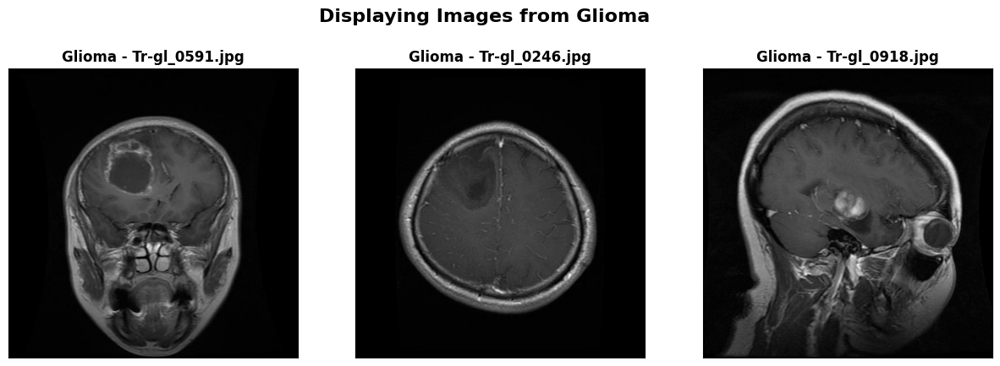

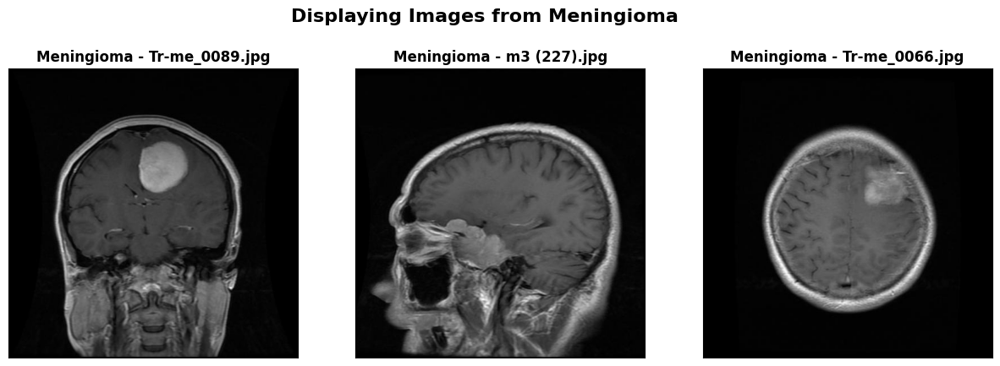

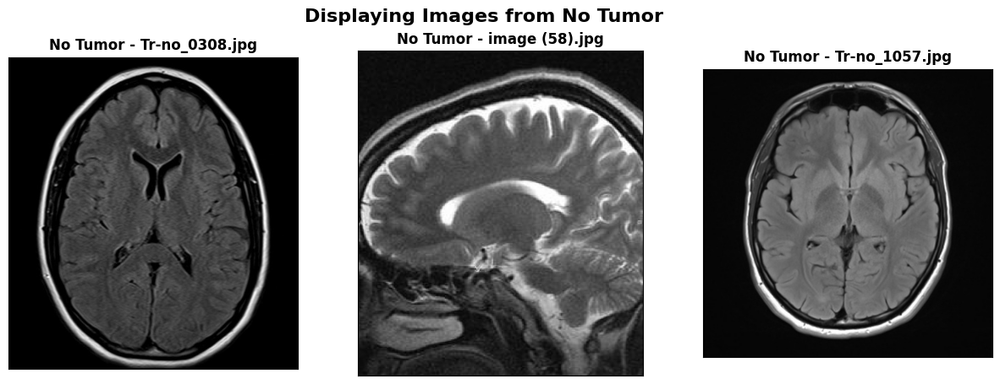

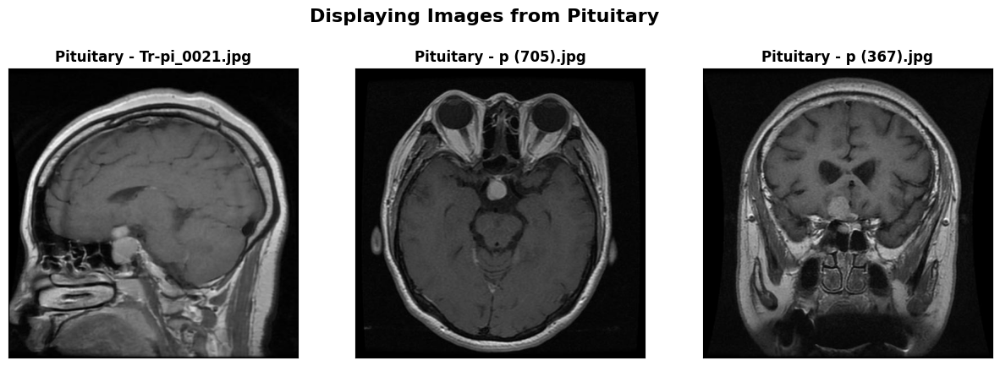

In [3]:
def load_data(directory):
    images =[]
    labels = []
    for class_name in os.listdir(directory):
        images_path = os.path.join(directory, class_name, 'images')
        labels_path = os.path.join(directory, class_name, 'labels')
        for image in os.listdir(images_path):
            img = cv2.imread(os.path.join(images_path, image))
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            label_file = image.replace('.jpg', '.txt')
            label_file_path = os.path.join(labels_path, label_file)
            if os.path.exists(label_file_path):
                with open(label_file_path, 'r') as file:
                    label_data = file.readline().strip().split()
                    if len(label_data) > 0:
                        images.append(img)
                        labels.append(label_data)
                    else:
                        print(f"Label file {label_file_path} is empty, skipping this image.")
            else:
                print(f"Label file {label_file_path} not found, skipping this image.")
    return images, labels

# Paths to data directories
train_path = r'C:\Users\parth\final2\dataset\Train'
val_path = r'C:\Users\parth\final2\dataset\Val'

# Load training and validation data
train_images, train_labels = load_data(train_path)
val_images, val_labels = load_data(val_path)

def display_random_images(directory, num_images=3):
#     images, labels = load_data(train_path)
    
    for class_name in os.listdir(directory):
        class_path = os.path.join(directory, class_name)
        images_path = os.path.join(directory, class_name, 'images')
        images = os.listdir(images_path)
        selected_images = random.sample(images, num_images)
        
        fig, axes = plt.subplots(1,3, figsize=(15,5))
        fig.suptitle(f"Displaying Images from {class_name}", fontsize=16, fontweight='bold')
        
        for ax, image in zip(axes, selected_images):
            image_path = os.path.join(images_path, image)
            img = mpimg.imread(image_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            ax.imshow(img)
            ax.set_title(f"{class_name} - {os.path.basename(image)}",fontweight='bold')
            ax.set_xticks([])
            ax.set_yticks([])

display_random_images(train_path)

In [4]:
# Image Preprocessing
def images_preprocessing(images):
    processed_images = []
    for img in images:
        img_resized = cv2.resize(img, (640, 640))
        processed_images.append(img_resized)
    return np.array(processed_images)

train_images = images_preprocessing(train_images)
val_images   = images_preprocessing(val_images)

Number of Images in Glioma : 1153
Number of Images in Meningioma : 1449
Number of Images in No Tumor : 711
Number of Images in Pituitary : 1424


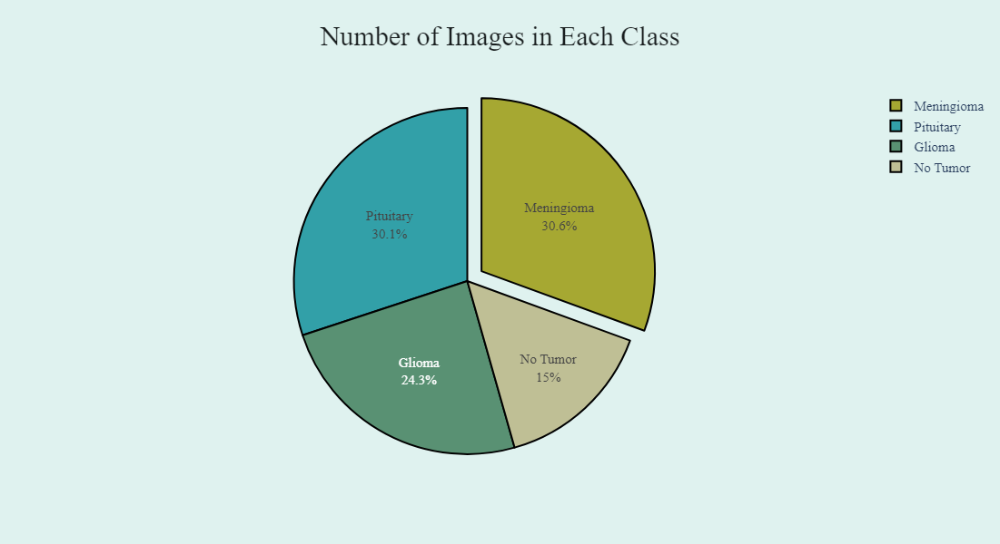

In [4]:
import os
import pandas as pd  # Importing pandas
import plotly.graph_objects as go
def count_images_in_folders(base_path):
    image_counts = []
    
    # Get all directories in the base_path
    main_directories = [d for d in os.listdir(base_path) if os.path.isdir(os.path.join(base_path, d))]
    
    for main_dir in main_directories:
        images_dir_path = os.path.join(base_path, main_dir, 'images')
        
        images = [f for f in os.listdir(images_dir_path) if os.path.isfile(os.path.join(images_dir_path, f))]
        
        print(f'\033[1mNumber of Images in {main_dir} : {len(images)}\033[0m')
        image_counts.append({'Class': main_dir, 'Count': len(images)})
    df = pd.DataFrame(image_counts).sort_values(by='Count',ascending=False)

    colors = ['#a6a832','#32a0a8', '#599173', '#bfbf95']
    fig = go.Figure(data=[go.Pie(labels=df['Class'], values = df['Count'], pull=[0.1,0,0,0],
                             textinfo ='label+percent', marker=dict(colors=colors, line=dict(color='black', width=2)))])
    fig.update_layout(paper_bgcolor='#dff2ef', plot_bgcolor='#dff2ef', title = 'Number of Images in Each Class', width=650, height=600, title_x=0.5, 
                  title_font_family="Times New Roman", title_font_color="#191e1f", title_font_size=30, font_family="Times New Roman", font_size=15)
    fig.show()
    return 

base_path = r'C:\Users\parth\final2\dataset\Train'
count_images_in_folders(base_path)

Number of Labels in Glioma : 1153
Number of Labels in Meningioma : 1449
Number of Labels in No Tumor : 711
Number of Labels in Pituitary : 1424


C:\Users\parth\AppData\Local\Temp\ipykernel_3344\944538360.py:16: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




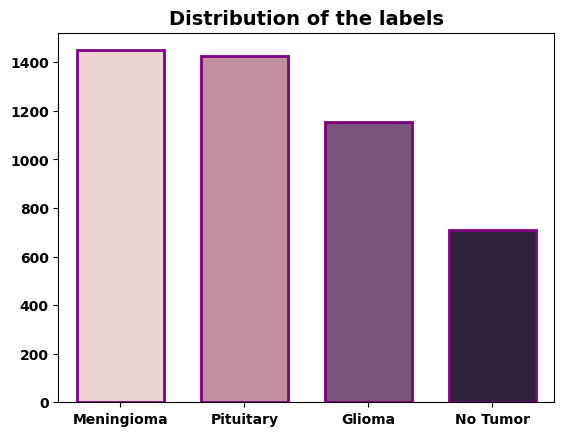

In [7]:
def count_labels_in_folders(base_path):
    label_counts = []
    
    # Get all directories in the base_path
    main_directories = [d for d in os.listdir(base_path) if os.path.isdir(os.path.join(base_path, d))]
    
    for main_dir in main_directories:
        label_dir_path = os.path.join(base_path, main_dir, 'labels')
        
        labels = [f for f in os.listdir(label_dir_path) if os.path.isfile(os.path.join(label_dir_path, f))]
        
        print(f'\033[1mNumber of Labels in {main_dir} : {len(labels)}\033[0m')
        label_counts.append({'Class': main_dir, 'Count': len(labels)})
    df1 = pd.DataFrame(label_counts).sort_values(by='Count',ascending=False)

    sns.barplot(df1, x='Class', y='Count', width=0.7, edgecolor='purple', linewidth=2, palette=sns.cubehelix_palette(n_colors=len(df1)))
    plt.title("Distribution of the labels", weight='bold', fontsize=14)
    plt.xticks(color='black',weight='bold')
    plt.yticks(color='black',weight='bold')
    plt.xlabel('', weight='bold', fontsize=14)
    plt.ylabel('',weight='bold', fontsize=14)
    plt.grid(False)
    return 

base_path = r'C:\Users\parth\final2\dataset\Train'
count_labels_in_folders(base_path)

In [14]:
# Create YOLOv8 Dataset Configuration File
dataset_yaml = {
    'path': 'C:\\Users\\parth\\final2\\dataset\\',
    'train': 'Train',
    'val': 'Val',
    'names': ["Glioma", "Meningioma", "No Tumor", "Pituitary"]
}

with open(r'C:\Users\parth\final2\dataset\dataset_yaml.yaml', 'w') as file:
    yaml.dump(dataset_yaml, file)

In [16]:
model = YOLO('yolov8n.yaml')
model = YOLO('yolov8n.pt')
train_results = model.train(data=r'C:\Users\parth\final2\dataset\dataset_yaml.yaml' , epochs=10, imgsz=640)

Ultralytics 8.3.7  Python-3.10.11 torch-1.12.0+cpu CPU (AMD Ryzen 7 7840HS w/ Radeon 780M Graphics)
WARNING  Upgrade to torch>=2.0.0 for deterministic training.
engine\trainer: task=detect, mode=train, model=yolov8n.pt, data=C:\Users\parth\final2\dataset\dataset_yaml.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=

train: Scanning C:\Users\parth\final2\dataset\Train\Glioma\labels.cache... 4737 images, 0 backgrounds, 0 corrupt: 100%|


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning C:\Users\parth\final2\dataset\Val\Glioma\labels.cache... 510 images, 3 backgrounds, 0 corrupt: 100%|█████

Plotting labels to runs\detect\train3\labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 63 weight(decay=0.0), 70 weight(decay=0.0005), 69 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs\detect\train3
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/297 [00:00<?, ?it/s]C:\Users\parth\AppData\Local\Programs\Python\Python310\lib\site-packages\torch\amp\autocast_mode.py:198: UserWarning:

User provided device_type of 'cuda', but CUDA is not available. Disabling

       1/10         0G       1.04      3.041      1.182          1        640: 100%|██████████| 297/297 [13:49<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:37

                   all        512        554      0.525      0.607      0.589       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/297 [00:00<?, ?it/s]C:\Users\parth\AppData\Local\Programs\Python\Python310\lib\site-packages\torch\amp\autocast_mode.py:198: UserWarning:

User provided device_type of 'cuda', but CUDA is not available. Disabling

       2/10         0G      1.016      1.587      1.162          1        640: 100%|██████████| 297/297 [13:35<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:35

                   all        512        554      0.805      0.683      0.796      0.584



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/297 [00:00<?, ?it/s]C:\Users\parth\AppData\Local\Programs\Python\Python310\lib\site-packages\torch\amp\autocast_mode.py:198: UserWarning:

User provided device_type of 'cuda', but CUDA is not available. Disabling

       3/10         0G      1.004      1.116      1.165          1        640: 100%|██████████| 297/297 [13:37<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:35

                   all        512        554      0.807        0.7      0.841      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/297 [00:00<?, ?it/s]C:\Users\parth\AppData\Local\Programs\Python\Python310\lib\site-packages\torch\amp\autocast_mode.py:198: UserWarning:

User provided device_type of 'cuda', but CUDA is not available. Disabling

       4/10         0G     0.9422      0.935      1.136          1        640: 100%|██████████| 297/297 [13:35<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:35

                   all        512        554      0.882      0.851      0.911      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/297 [00:00<?, ?it/s]C:\Users\parth\AppData\Local\Programs\Python\Python310\lib\site-packages\torch\amp\autocast_mode.py:198: UserWarning:

User provided device_type of 'cuda', but CUDA is not available. Disabling

       5/10         0G     0.9164      0.817       1.11          1        640: 100%|██████████| 297/297 [13:33<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:35

                   all        512        554      0.897      0.843      0.932      0.708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/297 [00:00<?, ?it/s]C:\Users\parth\AppData\Local\Programs\Python\Python310\lib\site-packages\torch\amp\autocast_mode.py:198: UserWarning:

User provided device_type of 'cuda', but CUDA is not available. Disabling

       6/10         0G     0.8677     0.7296      1.085          1        640: 100%|██████████| 297/297 [13:36<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:35

                   all        512        554      0.878      0.881      0.934      0.715



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/297 [00:00<?, ?it/s]C:\Users\parth\AppData\Local\Programs\Python\Python310\lib\site-packages\torch\amp\autocast_mode.py:198: UserWarning:

User provided device_type of 'cuda', but CUDA is not available. Disabling

       7/10         0G     0.8297     0.6625      1.072          2        640: 100%|██████████| 297/297 [13:35<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:35

                   all        512        554      0.889      0.923      0.951      0.741



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/297 [00:00<?, ?it/s]C:\Users\parth\AppData\Local\Programs\Python\Python310\lib\site-packages\torch\amp\autocast_mode.py:198: UserWarning:

User provided device_type of 'cuda', but CUDA is not available. Disabling

       8/10         0G     0.8139     0.6077       1.06          1        640: 100%|██████████| 297/297 [13:33<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:35

                   all        512        554      0.904      0.911      0.947       0.74



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/297 [00:00<?, ?it/s]C:\Users\parth\AppData\Local\Programs\Python\Python310\lib\site-packages\torch\amp\autocast_mode.py:198: UserWarning:

User provided device_type of 'cuda', but CUDA is not available. Disabling

       9/10         0G     0.7724     0.5515      1.033          1        640: 100%|██████████| 297/297 [13:39<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:35

                   all        512        554      0.929      0.911      0.954      0.757



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/297 [00:00<?, ?it/s]C:\Users\parth\AppData\Local\Programs\Python\Python310\lib\site-packages\torch\amp\autocast_mode.py:198: UserWarning:

User provided device_type of 'cuda', but CUDA is not available. Disabling

      10/10         0G     0.7417     0.5146      1.017          1        640: 100%|██████████| 297/297 [13:37<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:34

                   all        512        554      0.932      0.945      0.956      0.765



10 epochs completed in 2.371 hours.
Optimizer stripped from runs\detect\train3\weights\last.pt, 5.6MB
Optimizer stripped from runs\detect\train3\weights\best.pt, 5.6MB

Validating runs\detect\train3\weights\best.pt...
Ultralytics 8.3.7  Python-3.10.11 torch-1.12.0+cpu CPU (AMD Ryzen 7 7840HS w/ Radeon 780M Graphics)
Model summary (fused): 186 layers, 2,685,148 parameters, 0 gradients, 6.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:29


                   all        512        554      0.932      0.945      0.956      0.765
                Glioma        135        153        0.9      0.885      0.921      0.729
            Meningioma        140        142      0.972      0.979      0.991      0.834
              No Tumor         98         98       0.97       0.98      0.975      0.773
             Pituitary        154        161      0.887      0.938      0.935      0.726
Speed: 0.9ms preprocess, 53.5ms inference, 0.0ms loss, 0.2ms postprocess per image
Results saved to runs\detect\train3


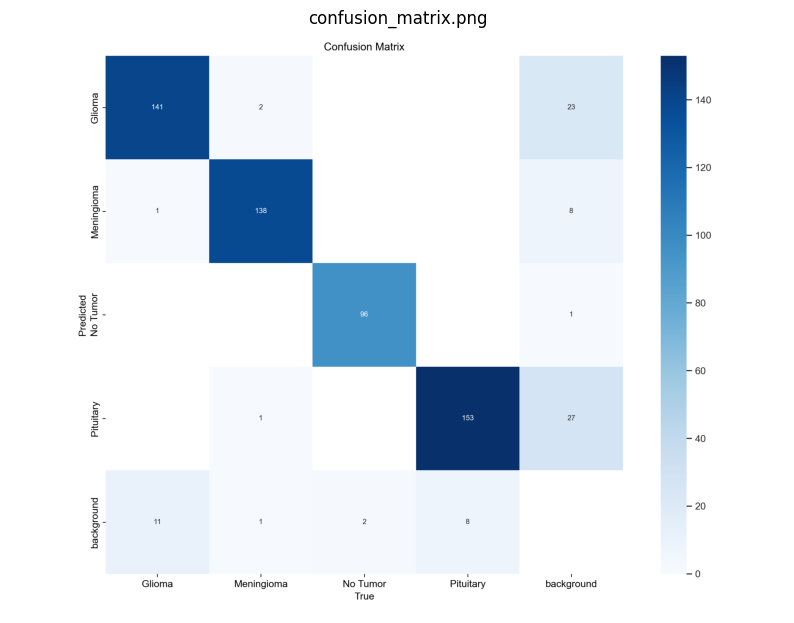

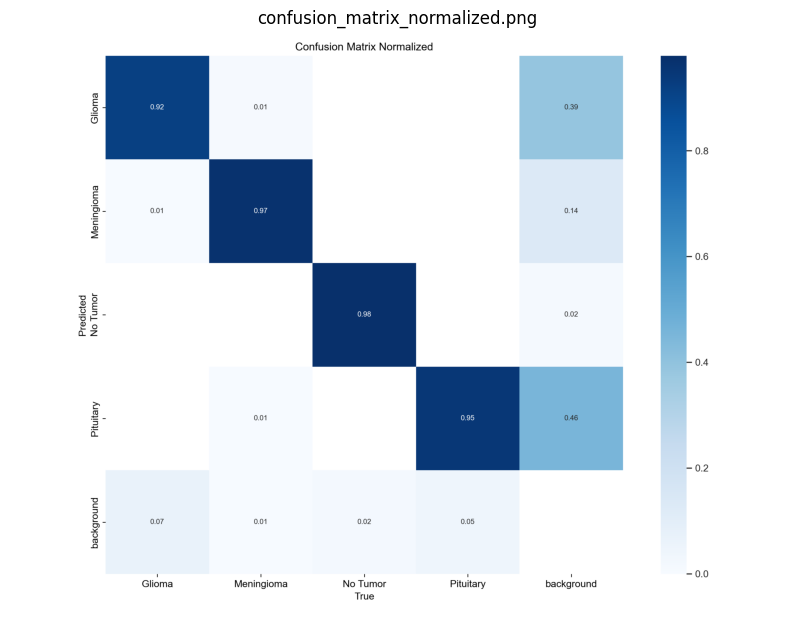

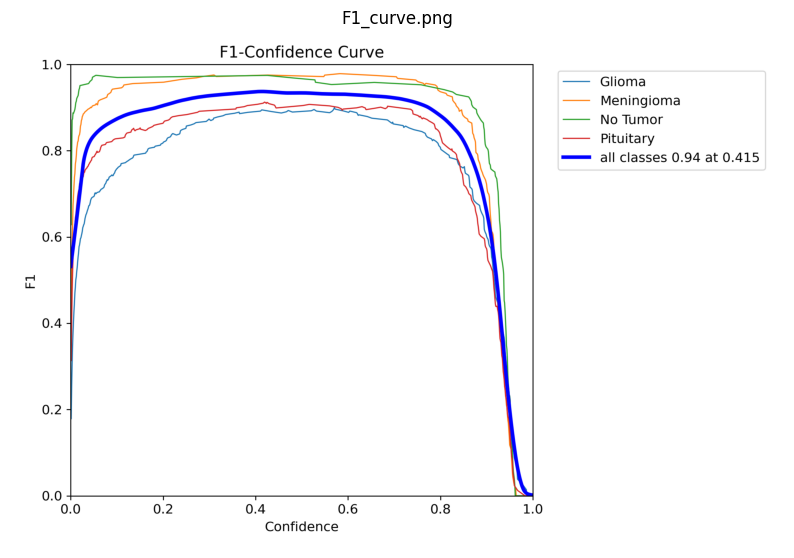

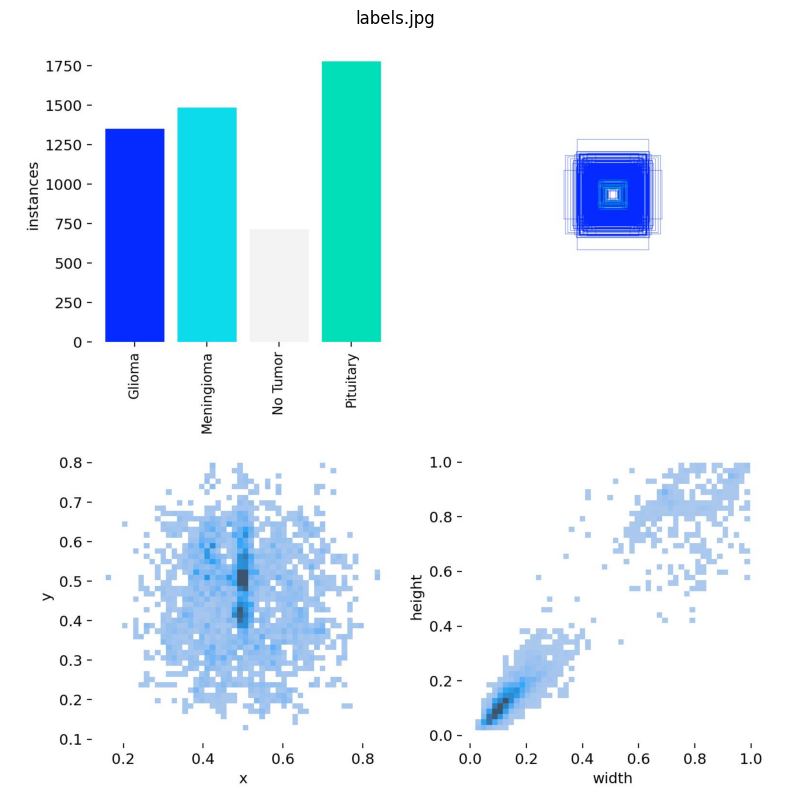

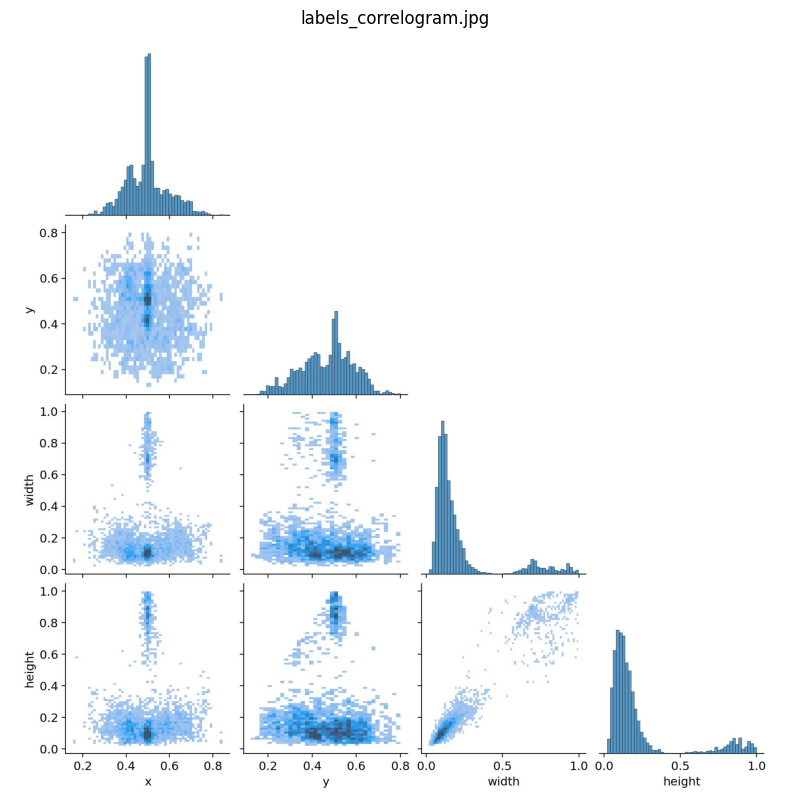

...

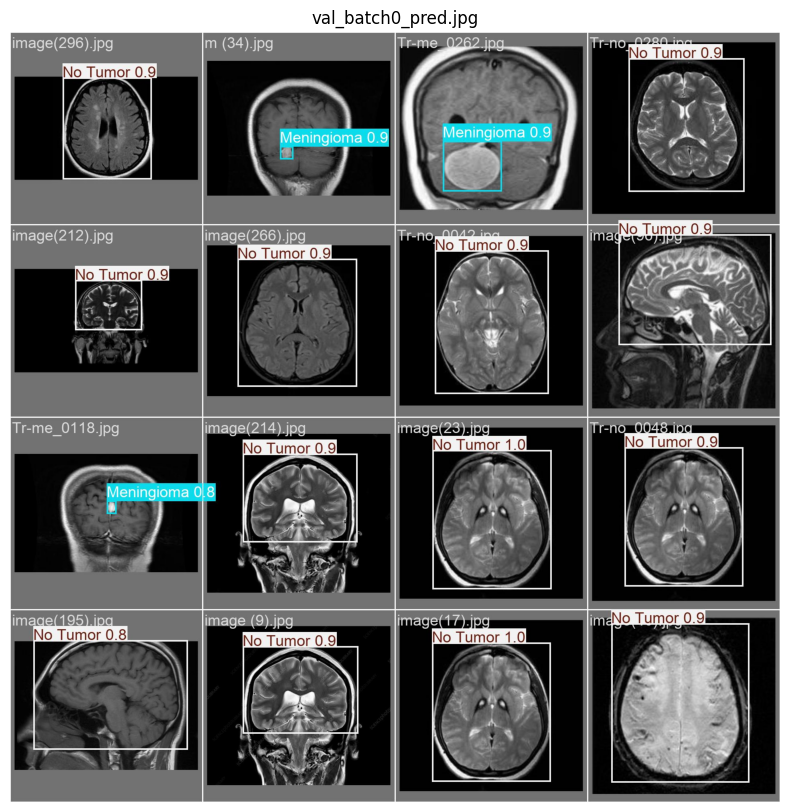

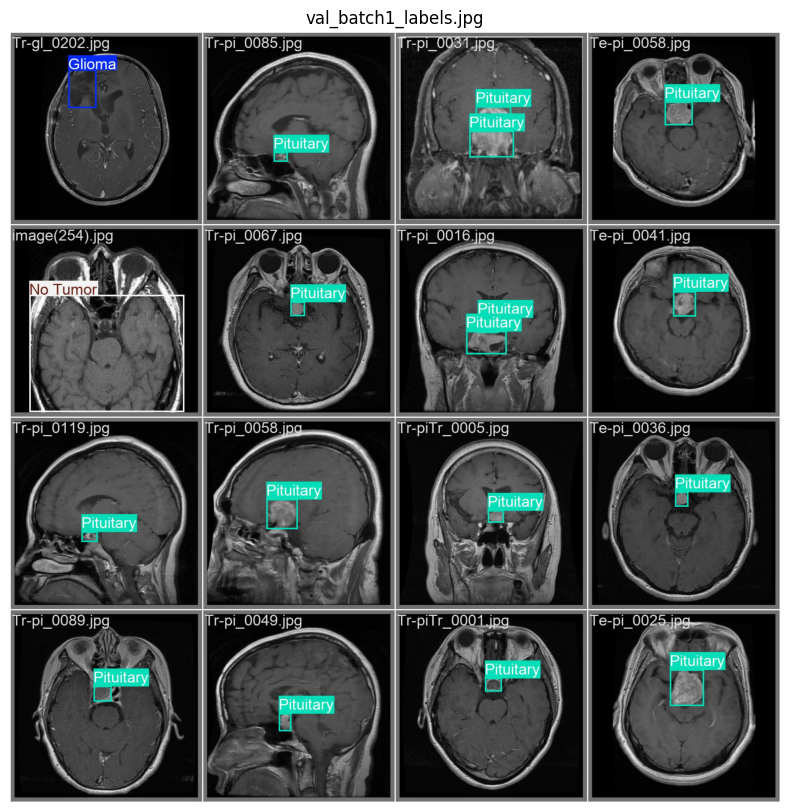

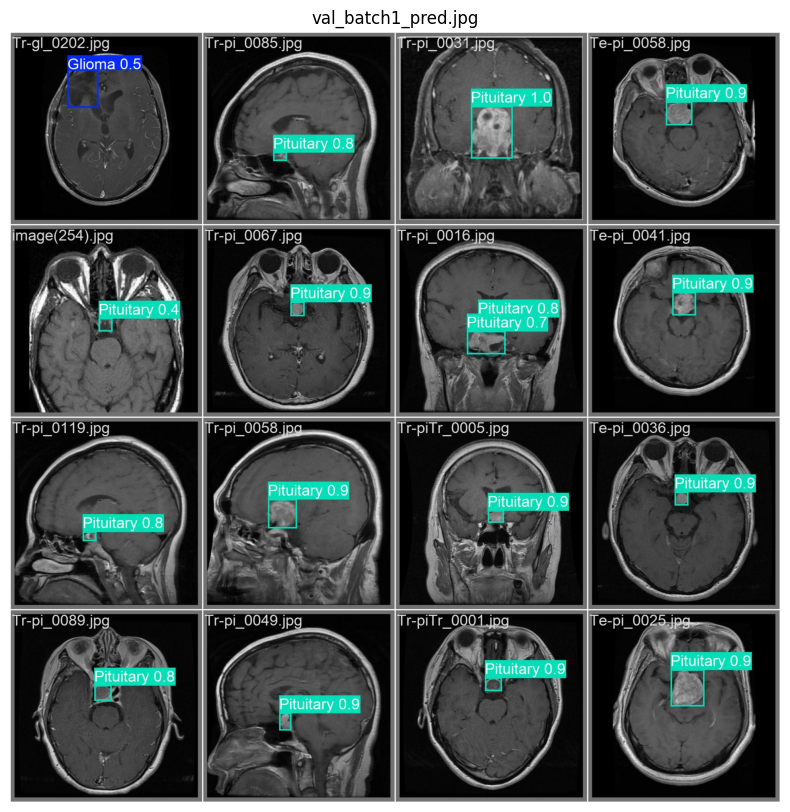

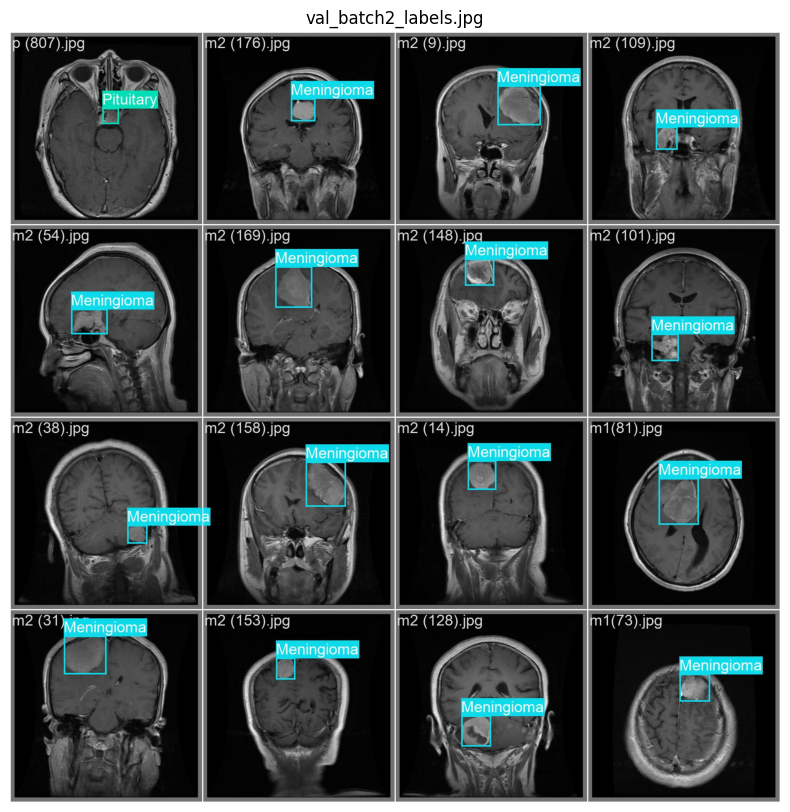

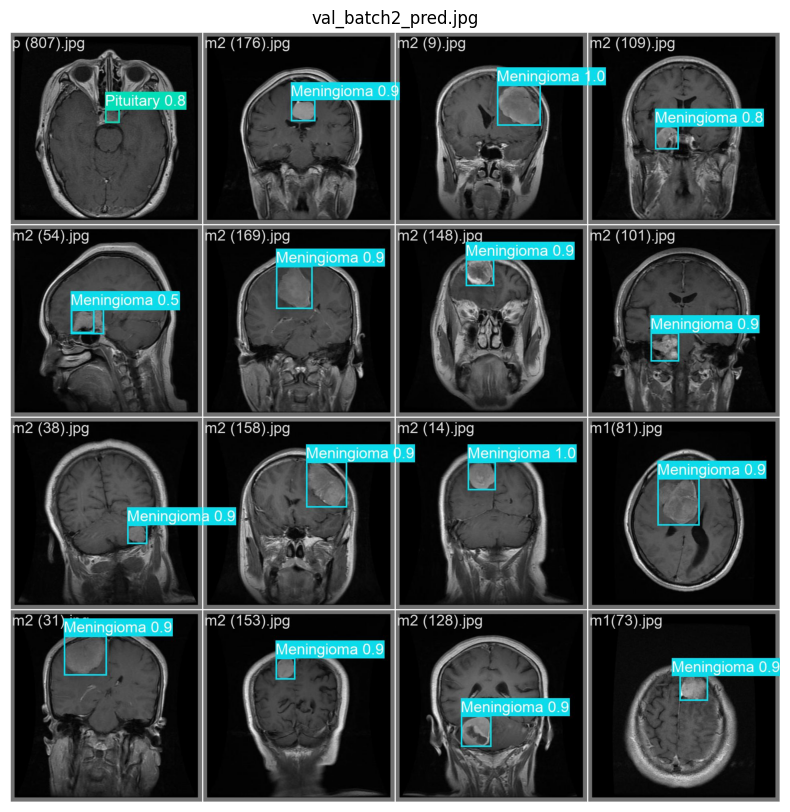

In [6]:
from PIL import Image
import matplotlib.pyplot as plt
import os
# Path to the results directory (adjust the path based on your setup)
results_dir = r'C:\Users\parth\final2\runs\detect\train3'

# List all images in the directory
result_images = [img for img in os.listdir(results_dir) if img.endswith('.jpg') or img.endswith('.png')]

# Display the images
for img_name in result_images:
    img_path = os.path.join(results_dir, img_name)
    img = Image.open(img_path)
    plt.figure(figsize=(10, 10))
    plt.imshow(img)
    plt.title(img_name)
    plt.axis('off')
    plt.show()

In [9]:
import torch

# Load your model
checkpoint = torch.load(r'C:\Users\parth\final2\runs\detect\train3\weights\best.pt')

# Check the keys in the checkpoint
print(checkpoint.keys())  # This will help you understand its structure

# Extract the model, if it's stored under a specific key
if 'model' in checkpoint:
    model = checkpoint['model']
else:
    model = checkpoint  # If no model key, use the loaded object directly

# Set the model to evaluation mode
model.eval()


dict_keys(['date', 'version', 'license', 'docs', 'epoch', 'best_fitness', 'model', 'ema', 'updates', 'optimizer', 'train_args', 'train_metrics', 'train_results'])


DetectionModel(
  (model): Sequential(
    (0): Conv(
      (conv): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(16, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
      (act): SiLU(inplace=True)
    )
    (1): Conv(
      (conv): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
      (act): SiLU(inplace=True)
    )
    (2): C2f(
      (cv1): Conv(
        (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (cv2): Conv(
        (conv): Conv2d(48, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
    

In [6]:
import cv2
import numpy as np
from ultralytics import YOLO
from tkinter import filedialog, Tk, Button, Label, Frame
from PIL import Image, ImageTk

# Initialize Tkinter root window
root = Tk()
root.title("Brain Tumor Detection Through MRI Scans")
root.geometry("800x700")  # Set a larger size for the window
root.configure(bg='#f0f0f0')

# Set a custom icon (replace 'path_to_icon.ico' with your icon path)
root.iconbitmap(r"C:\Users\parth\final2\brain-tumor-icon.ico")  # Use raw string for Windows paths

# Load your YOLO model
model_path = r"C:\Users\parth\final2\runs\detect\train3\weights\best.pt"
model = YOLO(model_path)  # Load the YOLO model

# Create a frame for better organization
frame = Frame(root)
frame.pack(pady=20)

# Function to upload an image
def upload_image():
    file_path = filedialog.askopenfilename(title="Select an Image", filetypes=[("Image Files", "*.jpg;*.jpeg;*.png")])
    if file_path:
        print(f"Image uploaded: {file_path}")
        detect_tumor(file_path)  # Call detection function

# Function to perform inference on the uploaded image
def detect_tumor(image_path):
    print("Processing the uploaded image...")
    
    # Read image using OpenCV
    image = cv2.imread(image_path)
    
    # Perform inference using YOLOv8 model
    results = model(image)  # Use the loaded model for inference
    print("Inference completed.")

    # Get detections (bounding boxes, confidence, and class labels)
    detections = results[0].boxes.xyxy  # Bounding boxes
    confidences = results[0].boxes.conf  # Confidence scores

    # If no detection, display message
    if len(detections) == 0:
        print("No tumor detected.")
        return
    
    # Define colors
    hacker_green = (0, 255, 0)  # Bounding box color
    sky_blue = (255, 87, 51)     # Text color

    # Draw bounding boxes and display accuracy and precision
    for i, box in enumerate(detections):
        x1, y1, x2, y2 = map(int, box)  # Convert to integer coordinates
        confidence = confidences[i]
        precision = confidence  # Assuming precision is same as confidence for demonstration
        
        # Draw a bounding box with hacker green color
        thickness = 1  # Thickness of the bounding box
        
        # Draw rectangle (bounding box)
        cv2.rectangle(image, (x1, y1), (x2, y2), hacker_green, thickness)
        
        # Display accuracy above the box
        font_scale = 0.6  # Font size
        acc_label = f"Acc: {confidence:.2f}"
        cv2.putText(image, acc_label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, font_scale, sky_blue, 2)  # Thicker text for boldness

        # Display precision below the box
        prec_label = f"Prec: {precision:.2f}"
        cv2.putText(image, prec_label, (x1, y2 + 20), cv2.FONT_HERSHEY_SIMPLEX, font_scale, sky_blue, 2)  # Thicker text for boldness

    # Convert image from BGR to RGB for displaying
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Convert the image to a format Tkinter can use
    img_pil = Image.fromarray(image)
    img_tk = ImageTk.PhotoImage(img_pil)

    # Update the label to display the image
    output_label.config(image=img_tk)
    output_label.image = img_tk  # Keep a reference to avoid garbage collection

    print("Image processed successfully!")

# Create upload button with customized style
upload_button = Button(
    frame,
    text="Upload MRI Scan",
    command=upload_image,
    width=20,
    height=2,
    bg="#4CAF50",  # Button background color
    fg="white",    # Text color
    font=("Arial", 14, "bold"),  # Font style and size
    activebackground="#45a049",  # Background color when pressed
    relief="raised"  # Button style
)

# Function to change button color on hover
def on_enter(event):
    upload_button['bg'] = '#45a049'  # Darker green on hover

def on_leave(event):
    upload_button['bg'] = '#4CAF50'  # Original green when not hovered

# Bind the hover events
upload_button.bind("<Enter>", on_enter)
upload_button.bind("<Leave>", on_leave)

upload_button.pack(pady=10)

# Create status label
status_label = Label(frame, text="Upload an MRI Scan of Brain.", wraplength=500)
status_label.pack(pady=5)

# Create a label to display the output image
output_label = Label(frame)
output_label.pack(pady=20)

# Run the Tkinter event loop
root.mainloop()


Image uploaded: C:/Users/parth/Bounders/dataset/Train/Pituitary/images/p (3).jpg
Processing the uploaded image...

0: 640x640 1 Pituitary, 64.4ms
Speed: 9.3ms preprocess, 64.4ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)
Inference completed.
Image processed successfully!
